Nama : Dika Kencana Putera

kelompok : Deep Learning 4.0

In [1]:
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
from dython.nominal import associations
from quickda.explore_numeric import *
from quickda.explore_data import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *
from quickda.clean_data import *

# EDA

In [43]:
df = pd.read_csv("E:/DIKA's/DATA PRODUKTIF DIKA\DATA SCIENCE/Rakamin/Dataset/flight.csv")

In [3]:
explore(df, method='profile', report_name = 'df_report')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
pd.set_option('display.max_rows', None)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62988 entries, 0 to 62987
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   MEMBER_NO          62988 non-null  int64  
 1   FFP_DATE           62988 non-null  object 
 2   FIRST_FLIGHT_DATE  62988 non-null  object 
 3   GENDER             62985 non-null  object 
 4   FFP_TIER           62988 non-null  int64  
 5   WORK_CITY          60719 non-null  object 
 6   WORK_PROVINCE      59740 non-null  object 
 7   WORK_COUNTRY       62962 non-null  object 
 8   AGE                62568 non-null  float64
 9   LOAD_TIME          62988 non-null  object 
 10  FLIGHT_COUNT       62988 non-null  int64  
 11  BP_SUM             62988 non-null  int64  
 12  SUM_YR_1           62437 non-null  float64
 13  SUM_YR_2           62850 non-null  float64
 14  SEG_KM_SUM         62988 non-null  int64  
 15  LAST_FLIGHT_DATE   62988 non-null  object 
 16  LAST_TO_END        629

**Mengubah dtype yang tidak tepat**

Berdasarkan EDA, terdapat 5 fitur yang akan diubah dtypenya, yakni: 
1. 'FFP_DATE', 'FIRST_FLIGHT_DATE', 'LAST_FLIGHT_DATE', 'LOAD_TIME' menjadi datetime64[ns], karena value pada fitur tersebut mendeskripsikan waktu
2. 'FFP_TIER' menjadi object, karena hanya terdapat 3 unique value

In [44]:
df['FFP_DATE'] = pd.to_datetime(df['FFP_DATE'])
df['FIRST_FLIGHT_DATE'] = pd.to_datetime(df['FIRST_FLIGHT_DATE'])
df['LAST_FLIGHT_DATE'] = pd.to_datetime(df['LAST_FLIGHT_DATE'], errors='coerce')
df['LOAD_TIME'] = pd.to_datetime(df['LOAD_TIME'])

In [45]:
df['FFP_TIER'] = df['FFP_TIER'].astype(str)

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62988 entries, 0 to 62987
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   MEMBER_NO          62988 non-null  int64         
 1   FFP_DATE           62988 non-null  datetime64[ns]
 2   FIRST_FLIGHT_DATE  62988 non-null  datetime64[ns]
 3   GENDER             62985 non-null  object        
 4   FFP_TIER           62988 non-null  object        
 5   WORK_CITY          60719 non-null  object        
 6   WORK_PROVINCE      59740 non-null  object        
 7   WORK_COUNTRY       62962 non-null  object        
 8   AGE                62568 non-null  float64       
 9   LOAD_TIME          62988 non-null  datetime64[ns]
 10  FLIGHT_COUNT       62988 non-null  int64         
 11  BP_SUM             62988 non-null  int64         
 12  SUM_YR_1           62437 non-null  float64       
 13  SUM_YR_2           62850 non-null  float64       
 14  SEG_KM

In [46]:
df = clean(df, method='standardize')
pd.set_option('display.max_columns', None)
df.head(5)

,member_no,ffp_date,first_flight_date,gender,ffp_tier,work_city,work_province,work_country,age,load_time,flight_count,bp_sum,sum_yr_1,sum_yr_2,seg_km_sum,last_flight_date,last_to_end,avg_interval,max_interval,exchange_count,avg_discount,points_sum,point_notflight
0,54993,2006-11-02,2008-12-24,Male,6,.,beijing,CN,31.0,2014-03-31,210,505308,239560.0,234188.0,580717,2014-03-31,1,3.483254,18,34,0.961639,619760,50
1,28065,2007-02-19,2007-08-03,Male,6,NaN,beijing,CN,42.0,2014-03-31,140,362480,171483.0,167434.0,293678,2014-03-25,7,5.194245,17,29,1.252314,415768,33
2,55106,2007-02-01,2007-08-30,Male,6,.,beijing,CN,40.0,2014-03-31,135,351159,163618.0,164982.0,283712,2014-03-21,11,5.298507,18,20,1.254676,406361,26
3,21189,2008-08-22,2008-08-23,Male,5,Los Angeles,CA,US,64.0,2014-03-31,23,337314,116350.0,125500.0,281336,2013-12-26,97,27.863636,73,11,1.090870,372204,12
4,39546,2009-04-10,2009-04-15,Male,6,guiyang,guizhou,CN,48.0,2014-03-31,152,273844,124560.0,130702.0,309928,2014-03-27,5,4.788079,47,27,0.970658,338813,39


**Deskripsi Statistik**

In [47]:
cat = []
num = []
dat = []
for col in df.columns: 
    if df[col].dtype == 'O':
        cat.append(col)
    elif df[col].dtype == 'int64' or df[col].dtype == 'float64':
        num.append(col)
    else:
        dat.append(col)

In [10]:
df[num].describe()

,member_no,age,flight_count,bp_sum,sum_yr_1,sum_yr_2,seg_km_sum,last_to_end,avg_interval,max_interval,exchange_count,avg_discount,points_sum,point_notflight
count,62988.000000,62568.000000,62988.000000,62988.000000,62437.000000,62850.000000,62988.000000,62988.000000,62988.000000,62988.000000,62988.000000,62988.000000,62988.0000,62988.000000
mean,31494.500000,42.476346,11.839414,10925.081254,5355.376064,5604.026014,17123.878691,176.120102,67.749788,166.033895,0.319775,0.721558,12545.7771,2.728155
std,18183.213715,9.885915,14.049471,16339.486151,8109.450147,8703.364247,20960.844623,183.822223,77.517866,123.397180,1.136004,0.185427,20507.8167,7.364164
min,1.000000,6.000000,2.000000,0.000000,0.000000,0.000000,368.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000
25%,15747.750000,35.000000,3.000000,2518.000000,1003.000000,780.000000,4747.000000,29.000000,23.370370,79.000000,0.000000,0.611997,2775.0000,0.000000
50%,31494.500000,41.000000,7.000000,5700.000000,2800.000000,2773.000000,9994.000000,108.000000,44.666667,143.000000,0.000000,0.711856,6328.5000,0.000000
75%,47241.250000,48.000000,15.000000,12831.000000,6574.000000,6845.750000,21271.250000,268.000000,82.000000,228.000000,0.000000,0.809476,14302.5000,1.000000
max,62988.000000,110.000000,213.000000,505308.000000,239560.000000,234188.000000,580717.000000,731.000000,728.000000,728.000000,46.000000,1.500000,985572.0000,140.000000


In [11]:
df[cat].describe()

,gender,ffp_tier,work_city,work_province,work_country,load_time
count,62985,62988,60719,59740,62962,62988
unique,2,3,3234,1165,118,1
top,Male,4,guangzhou,guangdong,CN,3/31/2014
freq,48134,58066,9386,17509,57748,62988


In [12]:
df[dat].describe()

C:\Users\m3\AppData\Local\Temp\ipykernel_17032\2471035750.py:1: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.

C:\Users\m3\AppData\Local\Temp\ipykernel_17032\2471035750.py:1: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.

C:\Users\m3\AppData\Local\Temp\ipykernel_17032\2471035750.py:1: FutureWarning:

Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.



,ffp_date,first_flight_date,last_flight_date
count,62988,62988,62567
unique,3068,3406,730
top,2011-01-13 00:00:00,2013-02-16 00:00:00,2014-03-31 00:00:00
freq,184,96,959
first,2004-11-01 00:00:00,1905-12-31 00:00:00,2012-04-01 00:00:00
last,2013-03-31 00:00:00,2015-05-30 00:00:00,2014-03-31 00:00:00


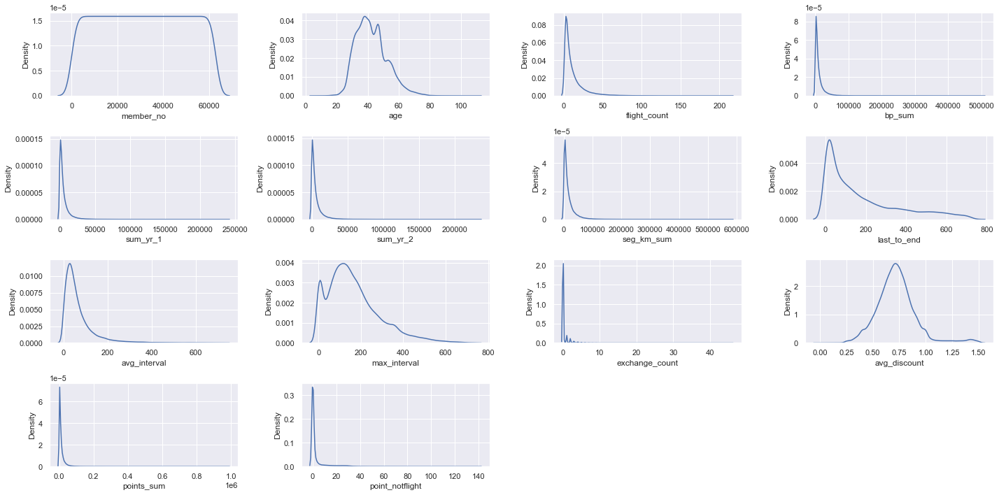

In [13]:
plt.figure(figsize= (20,10))
for i in range(len(num)):
    plt.subplot(4, 4, i+1)
    sns.kdeplot(x = df[num[i]])
    plt.tight_layout()

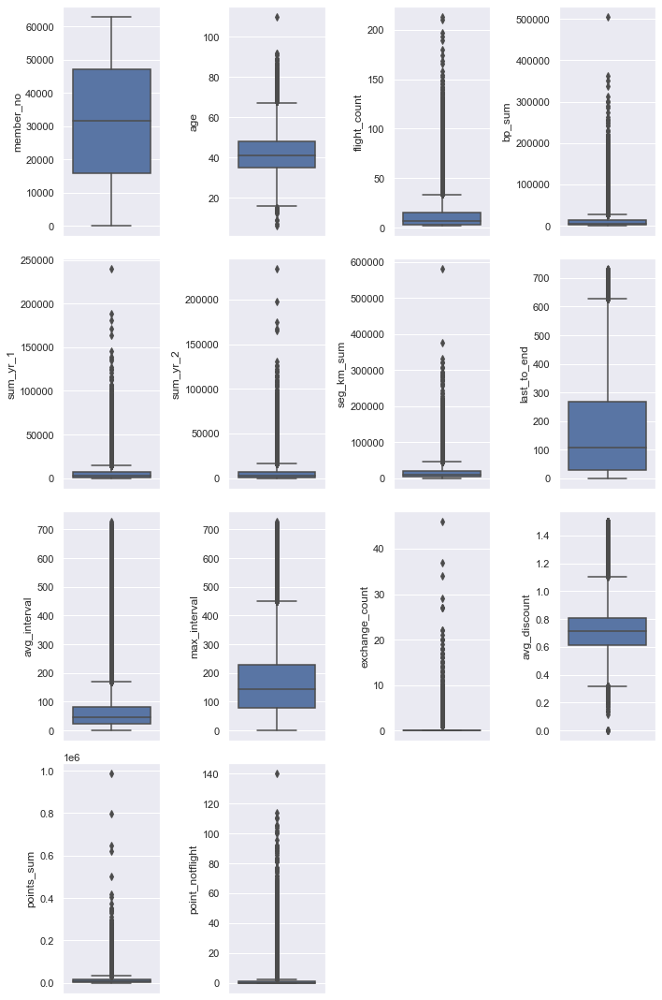

In [14]:
plt.figure(figsize= (10,15))
for i in range(len(num)):
    plt.subplot(4, 4, i+1)
    sns.boxplot(y = df[num[i]], orient='v')
    plt.tight_layout()

**Handling Missing Value**

In [48]:
df.isna().sum()

member_no               0
ffp_date                0
first_flight_date       0
gender                  3
ffp_tier                0
work_city            2269
work_province        3248
work_country           26
age                   420
load_time               0
flight_count            0
bp_sum                  0
sum_yr_1              551
sum_yr_2              138
seg_km_sum              0
last_flight_date      421
last_to_end             0
avg_interval            0
max_interval            0
exchange_count          0
avg_discount            0
points_sum              0
point_notflight         0
dtype: int64

In [49]:
df_clean = df.copy()

In [50]:
df_clean['age'].fillna(df_clean['age'].mean(), inplace=True)

Imputasi fitur 'age' dengan mean, berdasarkan distribusinya yang cenderung normal maka lebih baik diimputasi dengan nilai mean.

In [51]:
df_clean['sum_yr_1'].fillna(df_clean['sum_yr_1'].median(), inplace=True)
df_clean['sum_yr_2'].fillna(df_clean['sum_yr_2'].median(), inplace=True)

Imputasi fitur 'sum_yr_1' dan 'sum_yr_2' dengan median, berdasarkan distribusinya yang skewed-right maka lebih baik diimputasi dengan nilai median.

In [52]:
df_clean['gender'] = df_clean['gender'].fillna(df_clean['gender'].mode()[0])
df_clean['work_city'] = df_clean['work_city'].fillna(df_clean['work_city'].mode()[0])
df_clean['work_province'] = df_clean['work_province'].fillna(df_clean['work_province'].mode()[0])
df_clean['work_country'] = df_clean['work_country'].fillna(df_clean['work_country'].mode()[0])

In [53]:
df_clean['last_flight_date'] = df_clean['last_flight_date'].fillna(df_clean['last_flight_date'].mode()[0])

Imputasi fitur 'gender', 'work_city', 'work_province', 'work_country' dengan modus, karena fitur tersebut merupakan kategorikal maka lebih baik diisi dengan nilai modus. Sedangkan fitur 'last_fight_date' yang sebenarnya merupaka kategorikal hanya saja valuenya berupa waktu maka lebih baik diimputasi dengan nilai modus juga.

In [54]:
df_clean.isnull().sum()

member_no            0
ffp_date             0
first_flight_date    0
gender               0
ffp_tier             0
work_city            0
work_province        0
work_country         0
age                  0
load_time            0
flight_count         0
bp_sum               0
sum_yr_1             0
sum_yr_2             0
seg_km_sum           0
last_flight_date     0
last_to_end          0
avg_interval         0
max_interval         0
exchange_count       0
avg_discount         0
points_sum           0
point_notflight      0
dtype: int64

In [55]:
df_clean.duplicated().sum()

0

# Feature Engineering

**Feature Extraction**

In [56]:
df_fs = df_clean.copy()

In [57]:
df_fs['membership_period'] = ((df_fs['load_time'] - df_fs['ffp_date'])/np.timedelta64(1, 'M'))
df_fs['membership_period'] = df_fs['membership_period'].astype(int)

In [58]:
pd.set_option('display.max.columns', None)
df_fs.head()

,member_no,ffp_date,first_flight_date,gender,ffp_tier,work_city,work_province,work_country,age,load_time,flight_count,bp_sum,sum_yr_1,sum_yr_2,seg_km_sum,last_flight_date,last_to_end,avg_interval,max_interval,exchange_count,avg_discount,points_sum,point_notflight,membership_period
0,54993,2006-11-02,2008-12-24,Male,6,.,beijing,CN,31.0,2014-03-31,210,505308,239560.0,234188.0,580717,2014-03-31,1,3.483254,18,34,0.961639,619760,50,88
1,28065,2007-02-19,2007-08-03,Male,6,guangzhou,beijing,CN,42.0,2014-03-31,140,362480,171483.0,167434.0,293678,2014-03-25,7,5.194245,17,29,1.252314,415768,33,85
2,55106,2007-02-01,2007-08-30,Male,6,.,beijing,CN,40.0,2014-03-31,135,351159,163618.0,164982.0,283712,2014-03-21,11,5.298507,18,20,1.254676,406361,26,85
3,21189,2008-08-22,2008-08-23,Male,5,Los Angeles,CA,US,64.0,2014-03-31,23,337314,116350.0,125500.0,281336,2013-12-26,97,27.863636,73,11,1.090870,372204,12,67
4,39546,2009-04-10,2009-04-15,Male,6,guiyang,guizhou,CN,48.0,2014-03-31,152,273844,124560.0,130702.0,309928,2014-03-27,5,4.788079,47,27,0.970658,338813,39,59


**Feature Selection**

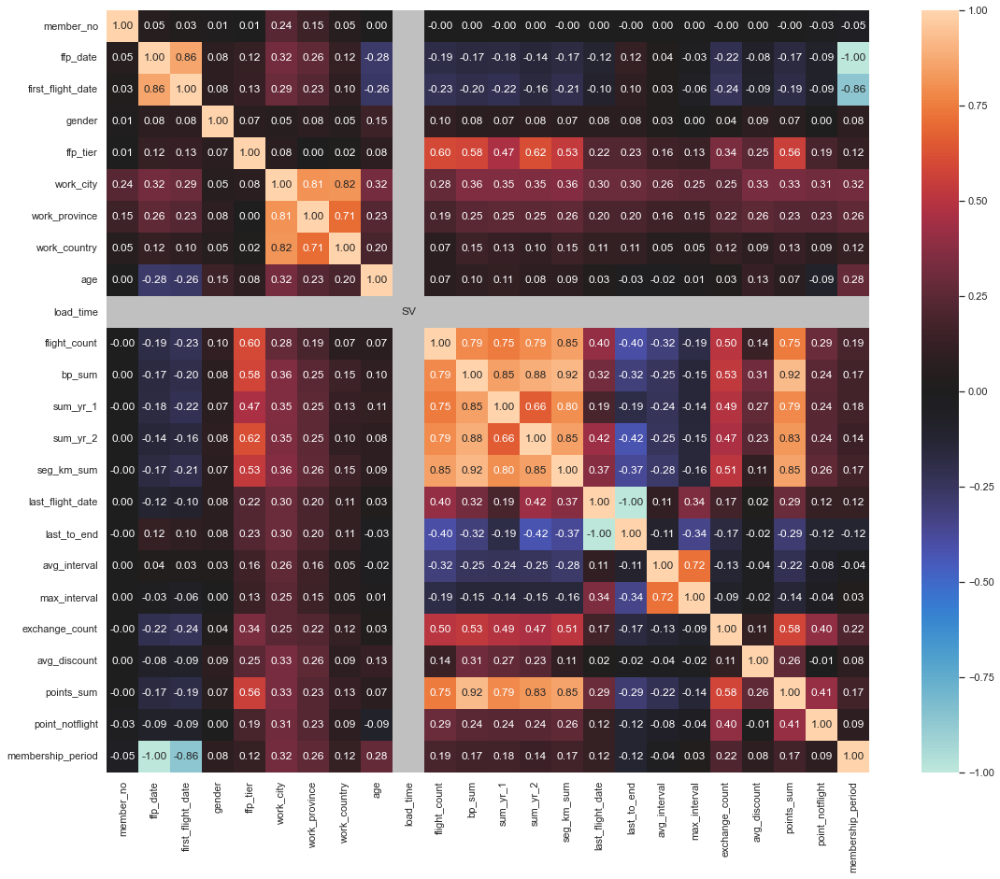

{'corr':                    member_no  ffp_date  first_flight_date    gender  ffp_tier  \
 member_no           1.000000  0.048117           0.030986  0.008585  0.006172   
 ffp_date            0.048117  1.000000           0.859492  0.084395  0.120132   
 first_flight_date   0.030986  0.859492           1.000000  0.081936  0.126856   
 gender              0.008585  0.084395           0.081936  1.000000  0.072852   
 ffp_tier            0.006172  0.120132           0.126856  0.072852  1.000000   
 work_city           0.237790  0.316733           0.294057  0.049016  0.077157   
 work_province       0.151474  0.258251           0.228856  0.084418  0.000000   
 work_country        0.047772  0.121533           0.100836  0.053055  0.016581   
 age                 0.001255 -0.276855          -0.257980  0.151455  0.080476   
 load_time           0.000000  0.000000           0.000000  0.000000  0.000000   
 flight_count       -0.000276 -0.190226          -0.231502  0.103644  0.599203   
 bp_sum 

In [59]:
fig, ax = plt.subplots(figsize=(20, 15))
associations(df_fs, ax=ax)

kolom yang akan dipilih berdasarkan RFM degan metode reduce dimensionality: 
1. R: last_to_end
2. F: flight_count
3. M: seg_km_sum
4. L: membership_period
5. C: avg_discount


In [354]:
df_rd = df_fs.copy()
df_rd = df_rd[['last_to_end', 'flight_count', 'seg_km_sum', 'membership_period', 'avg_discount']]
df_rd.columns = ['R', 'F', 'M', 'L', 'C']
df_rd.describe()

,R,F,M,L,C
count,62988.000,62988.000,62988.000,62988.000,62988.000
mean,176.120,11.839,17123.879,48.287,0.722
std,183.822,14.049,20960.845,27.832,0.185
min,1.000,2.000,368.000,11.000,0.000
25%,29.000,3.000,4747.000,24.000,0.612
50%,108.000,7.000,9994.000,41.000,0.712
75%,268.000,15.000,21271.250,71.000,0.809
max,731.000,213.000,580717.000,112.000,1.500


In [393]:
df_rd.shape

(62988, 5)

**Handling Outliers**

In [67]:
import statistics

In [398]:
df_ro = df_rd.copy()
#df_ro = df_ro.astype(float)
df_ro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62988 entries, 0 to 62987
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   R       62988 non-null  int64  
 1   F       62988 non-null  int64  
 2   M       62988 non-null  int64  
 3   L       62988 non-null  int32  
 4   C       62988 non-null  float64
dtypes: float64(1), int32(1), int64(3)
memory usage: 2.2 MB


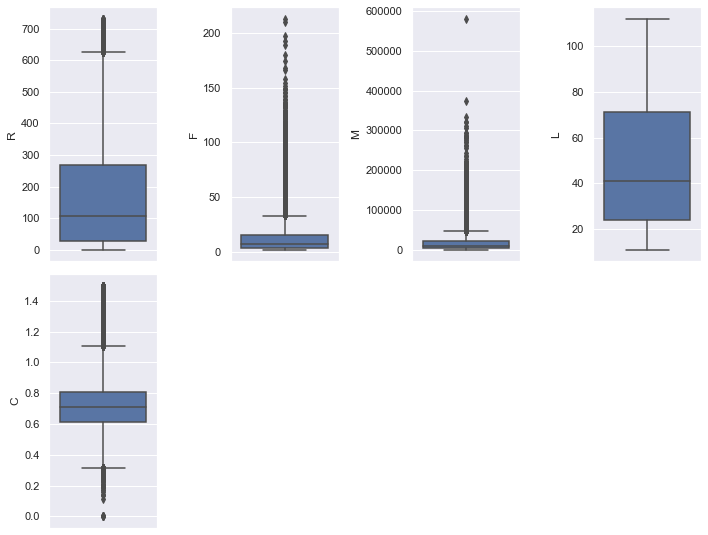

In [399]:
cols = df_ro.columns
plt.figure(figsize= (10,15))
for i in range(len(cols)):
    plt.subplot(4, 4, i+1)
    sns.boxplot(y = df_ro[cols[i]], orient='v')
    plt.tight_layout()

In [400]:
for col in cols:
    high_cut = df_ro[col].quantile(q=0.99)
    low_cut= df_ro[col].quantile(q=0.01)
    df_ro.loc[df_ro[col]>high_cut,col]=high_cut
    df_ro.loc[df_ro[col]<low_cut,col]=low_cut

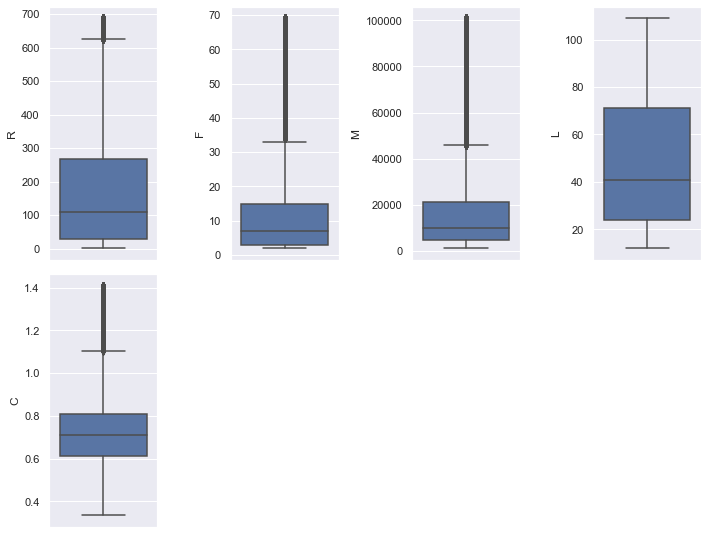

In [401]:
cols = df_ro.columns
plt.figure(figsize= (10,15))
for i in range(len(cols)):
    plt.subplot(4, 4, i+1)
    sns.boxplot(y = df_ro[cols[i]], orient='v')
    plt.tight_layout()

In [402]:
df_ro.describe()

,R,F,M,L,C
count,62988.000,62988.000,62988.000,62988.000,62988.000
mean,175.933,11.627,16757.990,48.272,0.722
std,183.287,12.812,18565.704,27.797,0.182
min,1.000,2.000,1190.000,12.000,0.335
25%,29.000,3.000,4747.000,24.000,0.612
50%,108.000,7.000,9994.000,41.000,0.712
75%,268.000,15.000,21271.250,71.000,0.809
max,687.000,69.000,100841.280,109.000,1.410


**Feature Transformation**

In [73]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [403]:
col_name = list(df_ro.columns)

mm = MinMaxScaler()
df_std_mm = mm.fit_transform(df_ro)
df_std_mm = pd.DataFrame(df_std_mm, columns=col_name)
df_std_mm.head()

,R,F,M,L,C
0,0.000,1.000,1.000,0.784,0.583
1,0.009,1.000,1.000,0.753,0.853
2,0.015,1.000,1.000,0.753,0.856
3,0.140,0.313,1.000,0.567,0.703
4,0.006,1.000,1.000,0.485,0.591


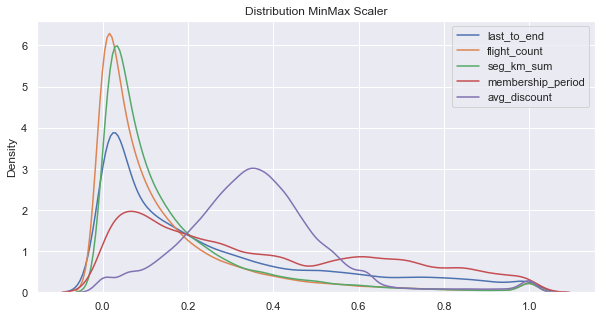

In [405]:
plt.figure(figsize=(10, 5))
plt.title('Distribution MinMax Scaler')
sns.kdeplot(df_std_mm['R'], label = 'last_to_end')
sns.kdeplot(df_std_mm['F'], label = 'flight_count')
sns.kdeplot(df_std_mm['M'], label = 'seg_km_sum')
sns.kdeplot(df_std_mm['L'], label = 'membership_period')
sns.kdeplot(df_std_mm['C'], label = 'avg_discount')
plt.xlabel(None)
plt.legend()
plt.show()

In [406]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
df_std_mm.describe()

,R,F,M,L,C
count,62988.000,62988.000,62988.000,62988.000,62988.000
mean,0.255,0.144,0.156,0.374,0.360
std,0.267,0.191,0.186,0.287,0.170
min,0.000,0.000,0.000,0.000,0.000
25%,0.041,0.015,0.036,0.124,0.258
50%,0.156,0.075,0.088,0.299,0.351
75%,0.389,0.194,0.202,0.608,0.441
max,1.000,1.000,1.000,1.000,1.000


In [266]:
df_std_mm.sample(10)

,flight_count,last_to_end,seg_km_sum,avg_discount,membership_period
2422,0.357,0.210,0.389,0.702,0.347
18152,0.143,0.068,0.234,0.337,0.149
10163,0.143,0.407,0.165,0.884,0.376
10855,0.405,0.052,0.298,0.415,0.010
58388,0.000,0.034,0.021,0.270,0.386
15462,0.310,0.141,0.285,0.313,0.069
53884,0.000,0.496,0.028,0.384,0.149
28605,0.095,0.837,0.137,0.343,0.327
22619,0.119,0.730,0.137,0.498,0.099
44939,0.048,0.323,0.050,0.415,0.376


# Modeling and Evaluation

**Inertia**

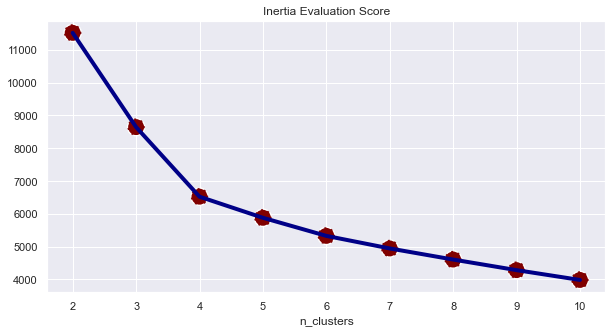

In [407]:
from sklearn.cluster import KMeans
inertia = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(df_std_mm)
    inertia.append(kmeans.inertia_)



plt.figure(figsize=(10, 5))
plt.title('Inertia Evaluation Score')
sns.lineplot(x=range(2, 11), y=inertia, color='#000087', linewidth = 4)
sns.scatterplot(x=range(2, 11), y=inertia, s=300, color='#800000',  linestyle='--')
plt.xlabel('n_clusters')
plt.show()

In [387]:
from sklearn.metrics import silhouette_score

range_n_clusters = list(range(2,11))
arr_silhouette_score_euclidean = []
for i in range_n_clusters:
    kmeans = KMeans(n_clusters=i).fit(df_std_mm)
    preds = kmeans.predict(df_std_mm)
    score_euclidean = silhouette_score(df_std_mm, preds, metric='euclidean')
    arr_silhouette_score_euclidean.append(score_euclidean)

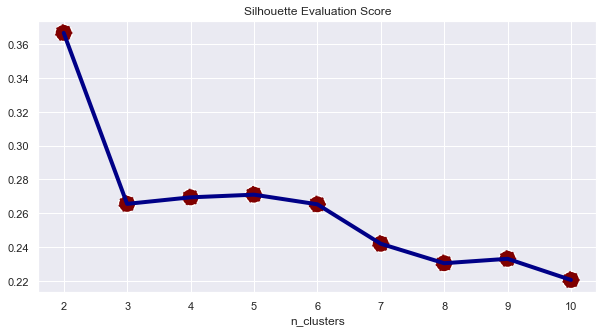

In [388]:
fig, ax = plt.subplots(figsize=(10, 5))
plt.title('Silhouette Evaluation Score')
sns.lineplot(x=range(2,11), y=arr_silhouette_score_euclidean, color='#000087', linewidth = 4)
sns.scatterplot(x=range(2,11), y=arr_silhouette_score_euclidean, s=300, color='#800000',  linestyle='--')
plt.xlabel('n_clusters')
plt.show()

In [408]:
df_std_cluster = df_std_mm.copy()
df_cluster = df_ro.copy()

kmeans = KMeans(n_clusters=4, random_state=0).fit(df_std_mm)
df_std_cluster['clusters'] = kmeans.labels_
df_cluster['clusters'] = kmeans.labels_

In [414]:
df_std_cluster.sample(15)

,R,F,M,L,C,clusters
3922,0.015,0.821,0.521,0.598,0.368,2
25079,0.241,0.045,0.098,0.423,0.492,0
17921,0.335,0.149,0.169,1.000,0.394,3
5390,0.013,0.388,0.450,0.928,0.348,2
53905,0.459,0.015,0.018,1.000,0.366,3
37234,0.669,0.060,0.086,0.082,0.193,1
38643,0.652,0.045,0.064,0.639,0.300,1
52168,0.580,0.030,0.025,0.206,0.310,1
46351,0.643,0.015,0.032,0.072,0.408,1
21242,0.017,0.179,0.135,0.371,0.420,0


In [415]:
df_cluster.sample(15)

,R,F,M,L,C,clusters
56049,687,2,3718.000,23,0.500,1
26573,108,9,12788.000,17,0.691,0
29915,4,4,7868.000,24,0.955,0
11480,8,18,27318.000,69,0.724,3
50690,624,4,3483.000,41,0.761,1
2056,3,46,79069.000,29,0.660,2
49388,551,5,6928.000,25,0.412,1
38558,199,4,9737.000,33,0.511,0
3412,57,32,53359.000,64,0.776,2
41628,264,4,5841.000,12,0.735,0


# Business Insight and Recommendation

In [181]:
from sklearn.decomposition import PCA 

In [411]:
pca = PCA(n_components=2)

pca.fit(df_std_mm)
pcs = pca.transform(df_std_mm)

df_pca = pd.DataFrame(data = pcs, columns = ['PC 1', 'PC 2'])
df_pca['clusters'] = df_cluster['clusters']
df_pca.sample(10)

,PC 1,PC 2,clusters
9798,0.152,-0.096,0
42287,-0.342,-0.157,0
4253,0.565,0.188,3
12289,0.009,-0.292,0
26209,-0.246,-0.067,0
17727,0.377,-0.148,2
1179,0.733,-0.493,2
34908,0.174,0.122,3
56017,-0.155,-0.350,0
32357,-0.489,0.126,1


<AxesSubplot:xlabel='PC 1', ylabel='PC 2'>

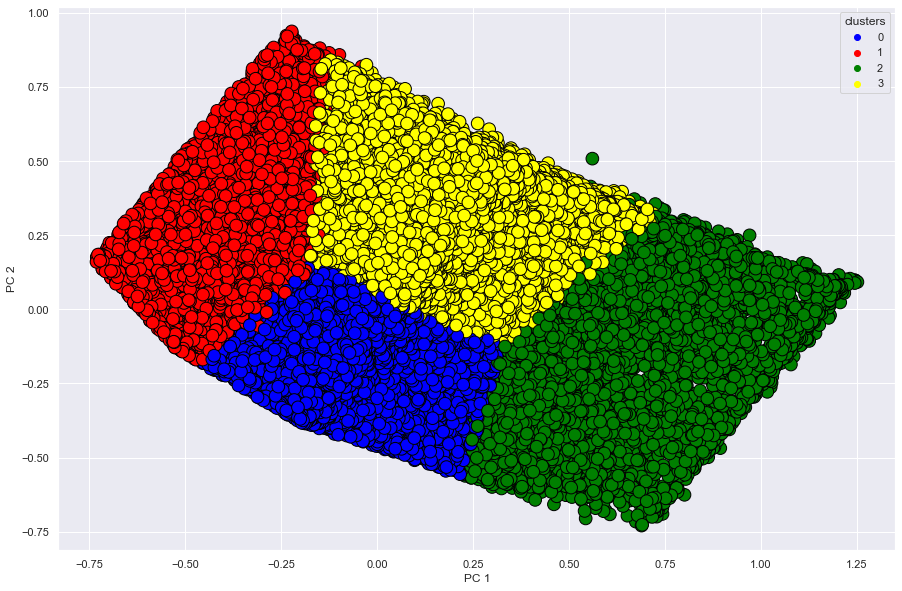

In [412]:
fig, ax = plt.subplots(figsize=(15,10))

sns.scatterplot(
    x="PC 1", y="PC 2",
    hue="clusters",
    edgecolor='black',
    #linestyle='--',
    data=df_pca,
    palette=['blue','red','green','yellow'],
    s=160,
    ax=ax
)

In [413]:
display(df_cluster.groupby('clusters').agg(['mean','median']))

R              F                M                L         \
            mean  median   mean median      mean    median   mean median   
clusters                                                                   
0        100.085  79.000  9.504  8.000 13622.337 10600.000 29.040 27.000   
1        480.511 475.000  3.899  3.000  6067.381  4289.500 38.377 32.000   
2         28.535  14.000 42.649 40.000 61278.551 56234.000 62.266 62.000   
3        116.608  86.000  9.904  8.000 14123.915 11325.000 80.793 80.000   

             C         
          mean median  
clusters               
0        0.704  0.700  
1        0.716  0.715  
2        0.788  0.749  
3        0.729  0.713

In [456]:
df_1 = df_cluster.groupby('clusters').agg({'R':'count'}).reset_index()
df_1 = df_1.rename(columns={'R':'Total Customers'})
df_1

,clusters,Total Customers
0,0,26820
1,1,12942
2,2,6015
3,3,17211


Berdasarkan hasil k-means clustering dan pca di atas, dapat disimpulkan: 
1. cluster 0 (potential customer) merupakan kelompok pelanggan penerbangan yang  tidak terlalu sering/tidak jarang juga melakukan penerbangan, serta merupakan pelanggan memiliki masa aktif sebagai member paling sebentar/pelanggan baru (L rendah), tingkat monetarynya terbilang sedang.
2. cluster 1 (low-valued customer) merupakan kelompok pelanggan penerbangan yang jarang melakukan penerbangan (frekuensi kecil), menghabiskan uang paling sedikit (monetery kecil)
3. cluster 2 (high-valued customer) merupakan kelompok pelanggan penerbangan yang sering melakukan penerbangan (frekuensi tinggi), menghabiskan uang paling banyak (monetary tinggi)
4. cluster 3 (retain-required customer) merupakan kelompok pelanggan penerbangan yang tidak terlalu sering/tidak jarang juga melakukan penerbangan, tetapi merupakan pelanggan yang memiliki masa aktif sebagai member paling lama/pelanggan lama (L paling tinggi), tingkat monetarynya terbilang sedang.

**Business Recommendation**

Promo yang akan diberikan dalam business recommendation berupa kupon dan diskon penerbangan.
Loyalty point berupa pemberian poin tambahan disetiap kali melakukan penerbangan sesuai dengan kelas pelanggan. 
1. Untuk cluster 0 yang dapat dikategorikan sebagai pelanggan baru, kita bisa memberikan promo.
2. Untuk cluster 3 yang dikategorikan sebgai pelanggan loyal, kita dapat memberikan 'loyalty point + promo'
3. untuk cluster 2 yang dikategorikan sebagai kita dapat memberikan 'loyalty point + peningkatan kelas pelanggan(4,5,6) + promo' dengan benefit tertentu di setiap tingkatannya 
4. untuk cluster 1 dapat diberikan promo yang sama dengan cluster 0 dengan tujuan meningkatkan frekuensi penerbangan. 